In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from models.NOT_SU_noinpuT import LoadNOTModel
from models.configs import LoadDataSU, NOTSU_configs, PADDING_VALUE, LoadCells
from torch.utils.data import DataLoader
from skimage import measure
from tqdm import tqdm
import time
import pickle
import pyvista as pv
device = "cuda" if torch.cuda.is_available() else "cpu"

In [14]:
# TODO: change to other backend ('html' 'client') for intearctive plots
pv_bc = "static"  # static" #'html' 'client'
pv.set_jupyter_backend(pv_bc)
# pv.global_theme.trame.jupyter_extension_enabled = True
# pv.global_theme.trame.server_proxy_enabled = True

if pv_bc == "static":
    window_size = (2048*2, 900*2)
else:
    window_size = (1350, 800)

In [3]:
configs = NOTSU_configs(input_T=False)
filebase = configs["filebase"]
model_args = configs["model_args"]
print(f"\n NOT SU Filebase: {filebase}, model_args:")
print(model_args)
print("\n\n model_args:")

notsu = LoadNOTModel(filebase, model_args)




 NOT SU Filebase: /work/hdd/bdsy/qibang/repository_Wbdsy/SDFGeoDesign/models/saved_weights/NOTSU_noinpT_test, model_args:
{'img_shape': (1, 120, 120), 'channel_mutipliers': [1, 2, 4, 8], 'has_attention': [False, False, False, False], 'first_conv_channels': 8, 'num_res_blocks': 1, 'norm_groups': 8, 'dropout': None, 'embed_dim': 64, 'cross_attn_layers': 2, 'num_heads': 8, 'in_channels': 2, 'out_channels': 3, 'emd_version': 'nerf', 'padding_value': -1000, 'num_frames': 26}


 model_args:
Total number of parameters of encoder: 553776, 553776 of which are trainable
Total number of parameters of NOT model: 949630, 949630 of which are trainable


In [4]:

def predict(data_loader, fwd_model, su_inverse):
    y_pred = []
    y_true = []
    sample_ids = np.empty(0, dtype=int)
    verts_all = []
    fwd_model.eval()
    with torch.no_grad():
        for data in tqdm(data_loader, desc="Predicting"):
            sdf = data[0].to(device)
            xyt = data[1].to(device)
            y_true_batch = data[2].to(device)
            mask = (y_true_batch != fwd_model.padding_value)
            pred = fwd_model(xyt, sdf)
            pred = su_inverse(pred)
            y_true_batch = su_inverse(y_true_batch)
            pred = [x[i].view(-1, *i.shape[1:]).cpu().detach().numpy()
                    for x, i in zip(pred, mask)]
            y_true_batch = [x[i].view(-1, *i.shape[1:]).cpu().detach().numpy()
                            for x, i in zip(y_true_batch, mask)]

            y_pred = y_pred+pred
            y_true = y_true+y_true_batch

            mask_verts = (xyt != PADDING_VALUE).cpu().detach().numpy()
            verts_all = verts_all+[x[i].view(-1, *i.shape[1:]).cpu().detach().numpy()
                                   for x, i in zip(xyt, mask_verts)]

            sample_ids = np.append(sample_ids, data[3].cpu().detach().numpy())
    return y_pred, y_true, verts_all, sample_ids


def plot_geo_from_sdf(sdf_norm, ax, sdf_inverse):
    sdf = sdf_inverse(sdf_norm.cpu().detach().numpy())
    sdf = sdf.reshape(120, 120)
    geo = measure.find_contours(
        sdf, 0, positive_orientation='high')
    nx = sdf.shape[0]-1
    for c, contour in enumerate(geo):
        contour = contour*1.2/nx-0.1
        x, y = contour[:, 1], contour[:, 0]
        if c == 0:

            ax.fill(x, y, alpha=1.0, edgecolor="black",
                    facecolor="cyan", label="Outer Boundary")
        else:
            ax.fill(x, y, alpha=1.0, edgecolor="black",
                    facecolor="white", label="Hole")
    ax.set_aspect("equal")
    ax.set_xlabel("x")
    ax.set_ylabel("y")



In [5]:
# Save the predictions, ground truth, vertices, and sample IDs to a pickle file
def save_load_results(predict=True, save=False):
    if predict:
        _, test_dataloader, sdf_inverse, su_inverse = LoadDataSU(
            bs_train=8, bs_test=128, input_T=False)
        time_start = time.time()
        su_pred_test, su_true_test, verts_all_test, sample_ids_test = predict(
            test_dataloader, notsu, su_inverse)
        time_end = time.time()
        print(
            f"Time taken to predict one sample: {(time_end-time_start)/len(su_pred_test):.2e} seconds")
        data_dic = {"su_pred_test": su_pred_test, "su_true_test": su_true_test,
                    "verts_all_test": verts_all_test, "sample_ids_test": sample_ids_test}
        if save:
            with open(filebase+'/test_results.pkl', 'wb') as f:
                pickle.dump(data_dic, f)
    else:
        # read the results from the pickle file
        with open(filebase+'/test_results.pkl', 'rb') as f:
            results = pickle.load(f)
            su_pred_test = results['su_pred_test']
            su_true_test = results['su_true_test']
            verts_all_test = results['verts_all_test']
            sample_ids_test = results['sample_ids_test']
    return su_pred_test, su_true_test, verts_all_test, sample_ids_test


su_pred_test, su_true_test, verts_all_test, sample_ids_test = save_load_results(
    predict=False, save=False)


Mean L2 error of stress: 0.10356607539836432, std: 0.04617111754057176
Index 0 for Best: 12456, error: 0.03412636121114095
Index 1 for 32% percentile: 9623, error: 0.08029757936795552
Index 2 for 64% percentile: 3559, error: 0.1054110328356425
Index 3 for 99% percentile: 11244, error: 0.2769480148951213


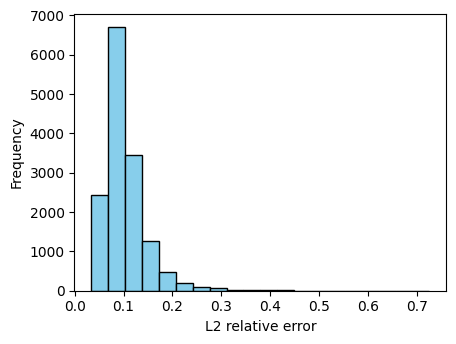

In [6]:


def cal_l2_error(y_pred, y_true):
    error_s = []
    for y_p, y_t in zip(y_pred, y_true):
        s_p, s_t = y_p[:, :, 0], y_t[:, :, 0]
        ux_p, ux_t = y_p[:, :, 1], y_t[:, :, 1]
        uy_p, uy_t = y_p[:, :, 2], y_t[:, :, 2]
        e_s = np.linalg.norm(s_p-s_t)/np.linalg.norm(s_t)
        e_ux = np.linalg.norm(ux_p-ux_t)/np.linalg.norm(ux_t)
        e_uy = np.linalg.norm(uy_p-uy_t)/np.linalg.norm(uy_t)
        error_s.append((e_s+e_ux+e_uy)/3)
    error_s = np.array(error_s)
    return error_s


error_s = cal_l2_error(su_pred_test, su_true_test)
mean, std = np.mean(error_s), np.std(error_s)
sort_idx = np.argsort(error_s)
fig = plt.figure(figsize=(4.8, 3.6))
ax = plt.subplot(1, 1, 1)

_ = ax.hist(error_s[sort_idx[:-2]], bins=20,
            color="skyblue", edgecolor="black")
ax.set_xlabel("L2 relative error")
ax.set_ylabel("Frequency")

print(f"Mean L2 error of stress: {mean}, std: {std}")


titles = ["Best", "32% percentile", "64% percentile", "99% percentile"]
min_index = sort_idx[0]
max_index = sort_idx[int(len(sort_idx)*0.99-1)]
median_index = sort_idx[int(len(sort_idx) * 0.32)]
median_index2 = sort_idx[int(len(sort_idx) * 0.64)]
indices = np.array([min_index, median_index, median_index2, max_index])
for i in range(len(indices)):
    print(
        f"Index {i} for {titles[i]}: {indices[i]}, error: {error_s[indices[i]]}")



In [7]:
def get_pvstyle_cells(cells_np):
    """cells_np is a numpy array of shape (N, 4)"""
    cell_types = np.zeros(len(cells_np), dtype=int)
    cells = np.empty((0,), dtype=int)
    for i, c in enumerate(cells_np):
        c = c-1  # abaqus uses 1-based index
        if c[-1] == c[-2]:
            cell_types[i] = pv.CellType.TRIANGLE
            cells = np.append(cells, np.array([3, *(c[:-1])]))
        else:
            cell_types[i] = pv.CellType.QUAD
            cells = np.append(cells, np.array([4, *c]))
    return cells, cell_types


def plot_results(su_true, su_pred, cells_np, verts,
                 label="Mises stress [MPa]", opacity=1.0,
                 cmap="viridis", pc_color='green', point_size=8.0,
                 notebook=None, show_edges=True,
                 html_file=None, window_size=(1024, 256)):
    """
    su_true: (N,8,3)
    """
    Nt = su_true.shape[1]
    max_s, min_s = np.max(su_true[:, -1, 0]), np.min(su_true[:, -1, 0])
    error_s = np.abs(su_true[:, -1, 0]-su_pred[:, -1, 0])
    max_e, min_e = np.max(error_s), np.min(error_s)
    cells, cell_types = get_pvstyle_cells(cells_np)
    meshes_t = []
    meshes_p = []
    plotter = pv.Plotter(shape=(3, Nt), notebook=notebook,
                         window_size=window_size, border=False)
    lables_t = [f"true e: {((i)*3.2+4):.1f}%" for i in range(Nt)]
    lables_p = [f"pred e: {((i)*3.2+4):.1f}%" for i in range(Nt)]
    lables_e = [f"error e: {((i)*3.2+4):.1f}%" for i in range(Nt)]
    for i in range(Nt):
        sigma_true, sigma_pred = su_true[:, i, 0], su_pred[:, i, 0]
        error = np.abs(sigma_true-sigma_pred)
        defomred_verts_t = verts + su_true[:, i, 1:3]
        defomred_verts_t = np.hstack(
            (defomred_verts_t, np.zeros((defomred_verts_t.shape[0], 1))))

        mesh_t = pv.UnstructuredGrid(
            cells, cell_types, defomred_verts_t)
        mesh_t.point_data[lables_t[i]] = sigma_true
        plotter.subplot(0, i)
        plotter.add_mesh(mesh_t, scalars=lables_t[i],
                         show_edges=show_edges, opacity=opacity, cmap=cmap, clim=[min_s, max_s])
        plotter.view_xy()

        defomred_verts_p = verts + su_pred[:, i, 1:3]
        defomred_verts_p = np.hstack(
            (defomred_verts_p, np.zeros((defomred_verts_p.shape[0], 1))))
        mesh_p = pv.UnstructuredGrid(
            cells, cell_types, defomred_verts_p)
        mesh_p.point_data[lables_p[i]] = sigma_pred
        plotter.subplot(1, i)
        plotter.add_mesh(mesh_p, scalars=lables_p[i],
                         show_edges=show_edges, opacity=opacity,
                         cmap=cmap, clim=[min_s, max_s])
        plotter.view_xy()

        mesh_e = pv.UnstructuredGrid(
            cells, cell_types, defomred_verts_t)
        mesh_e.point_data[lables_e[i]] = error
        plotter.subplot(2, i)
        plotter.add_mesh(mesh_e, scalars=lables_e[i],
                         show_edges=show_edges, opacity=opacity, cmap=cmap, clim=[min_e, max_e])
        plotter.view_xy()

    plotter.show()



In [8]:
# performance on samples with cells; only the first 10000 samples have cells
cells10k = LoadCells()
sample_with_cells = np.where(sample_ids_test < 10000)[0]
error_s_with_cells = error_s[sample_with_cells]
sample_ids_test_with_cells = sample_ids_test[sample_with_cells]
s_pred_test_with_cells = [su_pred_test[i] for i in sample_with_cells]
s_true_test_with_cells = [su_true_test[i] for i in sample_with_cells]
verts_all_test_with_cells = [verts_all_test[i] for i in sample_with_cells]
sort_idx_with_cells = np.argsort(error_s_with_cells)

L2 realtive error of the best test sample: 0.03910610576470693


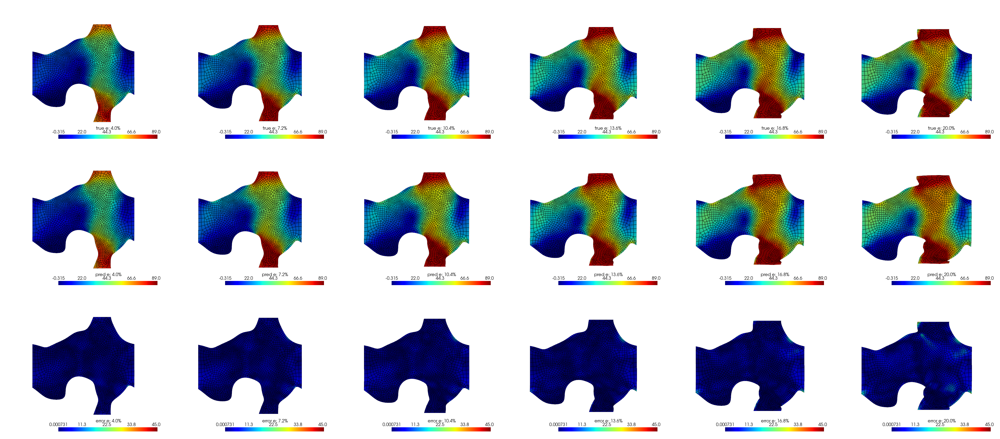

In [15]:
# plot the best sample
index = sort_idx_with_cells[0]
print(
    f"L2 realtive error of the best test sample: {error_s_with_cells[index]}")
cells_test = cells10k[sample_ids_test_with_cells[index]]
verts_test = verts_all_test_with_cells[index]
True_s_test = s_true_test_with_cells[index][:, 5::4]
Pred_s_test = s_pred_test_with_cells[index][:, 5::4]
plot_results(True_s_test, Pred_s_test, cells_test,
             verts_test, cmap="jet", show_edges=True, notebook=True, html_file=None, window_size=window_size)


L2 realtive error of the median test sample: 0.10144949952761333


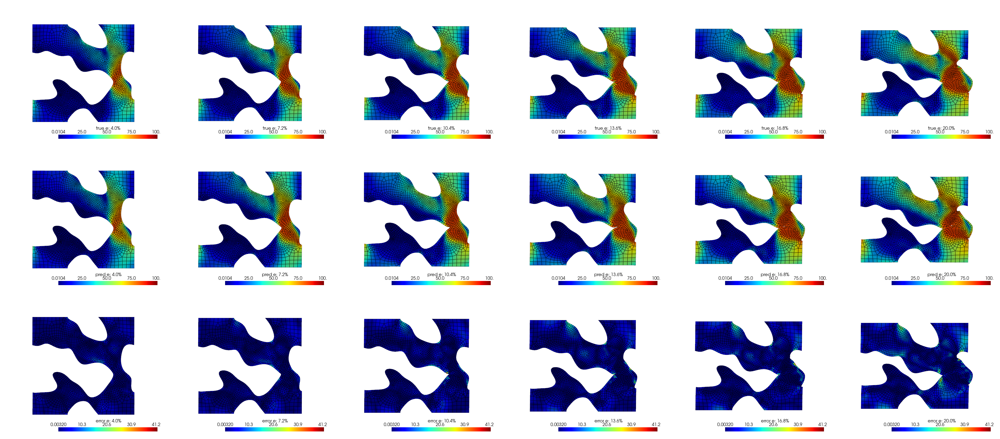

In [16]:
# plot the median sample
index = sort_idx_with_cells[int(len(sort_idx_with_cells)*0.5)-2]
print(
    f"L2 realtive error of the median test sample: {error_s_with_cells[index]}")
cells_test = cells10k[sample_ids_test_with_cells[index]]
verts_test = verts_all_test_with_cells[index]
True_s_test = s_true_test_with_cells[index][:, 5::4]
Pred_s_test = s_pred_test_with_cells[index][:, 5::4]
plot_results(True_s_test, Pred_s_test, cells_test,
             verts_test, cmap="jet", show_edges=True, notebook=True, html_file=None, window_size=window_size)


L2 realtive error of the worst test sample: 0.3208264509836833


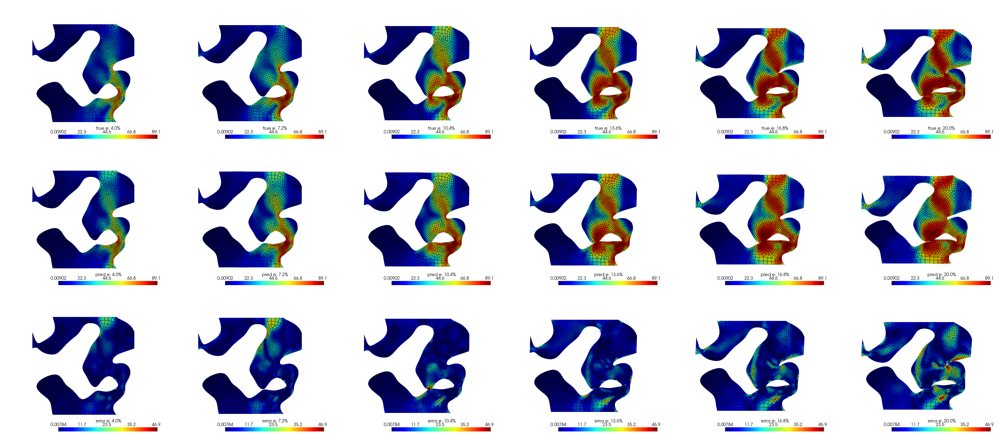

In [17]:
# plot the worst sample
index = sort_idx_with_cells[int(len(sort_idx_with_cells)*0.99)-0]
print(
    f"L2 realtive error of the worst test sample: {error_s_with_cells[index]}")
cells_test = cells10k[sample_ids_test_with_cells[index]]
verts_test = verts_all_test_with_cells[index]
True_s_test = s_true_test_with_cells[index][:, 5::4]
Pred_s_test = s_pred_test_with_cells[index][:, 5::4]
plot_results(True_s_test, Pred_s_test, cells_test,
             verts_test, cmap="jet", show_edges=True, notebook=True, html_file=None, window_size=window_size)
